# AITT Assignment

### Importing Necessary Libraries

In [1]:
# Need to Download all these python libraries before running the code

import numpy as np # pip install numpy
import pandas as pd # pip install pandas
import matplotlib.pyplot as plt # pip install matplotlib
import matplotlib.colors as mcolors
import seaborn as sns #pip install seaborn
%matplotlib inline

import ydata_profiling as yp # pip install ydata-profiling

from imblearn.over_sampling import SMOTE # pip install imbalanced-learn

# pip install scikit-learn
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, accuracy_score,classification_report, confusion_matrix, precision_score, recall_score, mean_squared_error, mean_absolute_error, r2_score, ConfusionMatrixDisplay, roc_curve, auc
from sklearn.datasets import make_regression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier


import shap # pip install shap
from xgboost import XGBRegressor # pip install xgboost

In [2]:
df = pd.read_csv("dataset.csv") # Reading data from a CSV file into a pandas DataFrame

In [3]:
df.head() # Displaying the first 5 rows of the DataFrame

,URL,URL_LENGTH,NUMBER_SPECIAL_CHARACTERS,CHARSET,SERVER,CONTENT_LENGTH,WHOIS_COUNTRY,WHOIS_STATEPRO,WHOIS_REGDATE,WHOIS_UPDATED_DATE,...,DIST_REMOTE_TCP_PORT,REMOTE_IPS,APP_BYTES,SOURCE_APP_PACKETS,REMOTE_APP_PACKETS,SOURCE_APP_BYTES,REMOTE_APP_BYTES,APP_PACKETS,DNS_QUERY_TIMES,Type
0,M0_109,16,7,iso-8859-1,nginx,263.0,NaN,NaN,10/10/2015 18:21,NaN,...,0,2,700,9,10,1153,832,9,2.0,1
1,B0_2314,16,6,UTF-8,Apache/2.4.10,15087.0,NaN,NaN,NaN,NaN,...,7,4,1230,17,19,1265,1230,17,0.0,0
2,B0_911,16,6,us-ascii,Microsoft-HTTPAPI/2.0,324.0,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0.0,0
3,B0_113,17,6,ISO-8859-1,nginx,162.0,US,AK,7/10/1997 4:00,12/09/2013 0:45,...,22,3,3812,39,37,18784,4380,39,8.0,0
4,B0_403,17,6,UTF-8,NaN,124140.0,US,TX,12/05/1996 0:00,11/04/2017 0:00,...,2,5,4278,61,62,129889,4586,61,4.0,0


In [4]:
df.columns # Accessing the column names of the DataFrame

Index(['URL', 'URL_LENGTH', 'NUMBER_SPECIAL_CHARACTERS', 'CHARSET', 'SERVER',
       'CONTENT_LENGTH', 'WHOIS_COUNTRY', 'WHOIS_STATEPRO', 'WHOIS_REGDATE',
       'WHOIS_UPDATED_DATE', 'TCP_CONVERSATION_EXCHANGE',
       'DIST_REMOTE_TCP_PORT', 'REMOTE_IPS', 'APP_BYTES', 'SOURCE_APP_PACKETS',
       'REMOTE_APP_PACKETS', 'SOURCE_APP_BYTES', 'REMOTE_APP_BYTES',
       'APP_PACKETS', 'DNS_QUERY_TIMES', 'Type'],
      dtype='object')

### Data Cleaning

In [5]:
# Looping through the DataFrame to check for null values in any column
for i in df.isnull().any():  # df.isnull().any() returns a Series indicating if any column has null values
    null = False  # Initializing the flag to indicate the presence of null values
    if i == True:  # If a column has null values
        null = True
        break  # Exit the loop as null values are detected
    else:
        continue  # Continue checking the next column if no null values are found in the current one

# Checking the result of the null flag
if null == False:  
    print("No Null Values")
else:
    print("Null Values Detected")
    print("==================")
    print("Null Values Are:")  
    # Display the number of null values in each column, sorted in descending order
    print(df.isnull().sum().sort_values(ascending=False))

Null Values Detected
Null Values Are:
CONTENT_LENGTH               812
WHOIS_STATEPRO               362
WHOIS_COUNTRY                306
SERVER                       176
WHOIS_UPDATED_DATE           139
WHOIS_REGDATE                127
CHARSET                        7
DNS_QUERY_TIMES                1
URL                            0
URL_LENGTH                     0
NUMBER_SPECIAL_CHARACTERS      0
DIST_REMOTE_TCP_PORT           0
TCP_CONVERSATION_EXCHANGE      0
REMOTE_IPS                     0
APP_BYTES                      0
REMOTE_APP_PACKETS             0
SOURCE_APP_PACKETS             0
SOURCE_APP_BYTES               0
REMOTE_APP_BYTES               0
APP_PACKETS                    0
Type                           0
dtype: int64


In [6]:
# Function to format a date string into a specific format by replacing '-' with '/'.
# Handles various invalid or special cases like None, np.nan, or specific unwanted strings.
def format_date(date_str):
    # Check for invalid input values and return NaN if found
    if date_str in [None, np.nan, "b", "0", "None"]:
        return np.nan
    
    # Split the date string into date and time parts based on the delimiter ('T' or space)
    if "T" in date_str:  # ISO format with 'T' as the separator
        split_datetime = date_str.split("T")
    else:  # Other formats that use a space separator
        split_datetime = date_str.split()
    
    # Extracting the date part (first element in the split result)
    date_part = split_datetime[0]
    
    # Replace '-' with '/' in the date part for formatting
    formatted_date = date_part.replace("-", "/")
    
    # Return the formatted date string
    return formatted_date

In [7]:
# Applying the format_date function to the "WHOIS_REGDATE" column
# The function processes each value in the column to ensure the date is formatted correctly.
df["WHOIS_REGDATE"] = df["WHOIS_REGDATE"].apply(format_date)

# Converting the formatted date strings to pandas datetime objects
# - format="%d/%m/%Y": Specifies the expected format for the dates (day/month/year).
# - errors="coerce": Invalid parsing will result in NaT (Not a Time) for problematic entries.
df["WHOIS_REGDATE"] = pd.to_datetime(df["WHOIS_REGDATE"], format="%d/%m/%Y", errors="coerce")

In [8]:
# Counting the occurrences of each unique value in the "WHOIS_REGDATE" column
# - dropna=False: Includes NaN (missing values) in the counts.
# - sort_index(): Sorts the results by index (i.e., the unique values or dates in this case).
df["WHOIS_REGDATE"].value_counts(dropna=False).sort_index()

WHOIS_REGDATE
1990-07-26      1
1990-12-12      4
1992-01-10      1
1992-02-21      2
1993-06-03      2
             ... 
2017-02-13      1
2017-03-11      1
2017-03-22      1
2017-04-14      1
NaT           135
Name: count, Length: 870, dtype: int64

In [9]:
# Applying the format_date function to the "WHOIS_UPDATED_DATE" column
# The function processes each value in the column to ensure the date is formatted correctly.
df["WHOIS_UPDATED_DATE"] = df["WHOIS_UPDATED_DATE"].apply(format_date)

# Converting the formatted date strings to pandas datetime objects
# - format="%d/%m/%Y": Specifies the expected format for the dates (day/month/year).
# - errors="coerce": Invalid parsing will result in NaT (Not a Time) for problematic entries.
df["WHOIS_UPDATED_DATE"] = pd.to_datetime(df["WHOIS_UPDATED_DATE"], format="%d/%m/%Y", errors="coerce")

In [10]:
# Counting occurrences of each unique value in the "WHOIS_UPDATED_DATE" column
# - dropna=False: Includes NaN values in the count.
# Sorting the resulting counts by the index (dates in ascending order).
df["WHOIS_UPDATED_DATE"].value_counts(dropna=False).sort_index()

WHOIS_UPDATED_DATE
2008-07-14      1
2008-12-13      1
2009-06-02      1
2009-09-30      1
2011-07-20      1
             ... 
2017-04-26      1
2017-04-27      4
2017-04-28      7
2017-04-29      2
NaT           144
Name: count, Length: 529, dtype: int64

In [11]:
# Replacing missing values in the "CONTENT_LENGTH" column with the median of the column
df["CONTENT_LENGTH"] = df["CONTENT_LENGTH"].fillna(df["CONTENT_LENGTH"].median())

# Replacing missing values in the "WHOIS_REGDATE" column with the median of the column
df["WHOIS_REGDATE"] = df["WHOIS_REGDATE"].fillna(df["WHOIS_REGDATE"].median())

# Replacing missing values in the "WHOIS_UPDATED_DATE" column with the median of the column
df["WHOIS_UPDATED_DATE"] = df["WHOIS_UPDATED_DATE"].fillna(df["WHOIS_UPDATED_DATE"].median())

In [12]:
# Displaying the count of missing (null) values for each column in the DataFrame
# - sort_values(ascending=False): Sorts the columns in descending order based on the count of null values.
print(df.isnull().sum().sort_values(ascending=False))

WHOIS_STATEPRO               362
WHOIS_COUNTRY                306
SERVER                       176
CHARSET                        7
DNS_QUERY_TIMES                1
URL_LENGTH                     0
NUMBER_SPECIAL_CHARACTERS      0
URL                            0
CONTENT_LENGTH                 0
WHOIS_UPDATED_DATE             0
TCP_CONVERSATION_EXCHANGE      0
DIST_REMOTE_TCP_PORT           0
WHOIS_REGDATE                  0
REMOTE_IPS                     0
APP_BYTES                      0
REMOTE_APP_PACKETS             0
SOURCE_APP_PACKETS             0
SOURCE_APP_BYTES               0
REMOTE_APP_BYTES               0
APP_PACKETS                    0
Type                           0
dtype: int64


In [13]:
# Dropping rows where the 'SERVER' column has missing (NaN) values
df = df.dropna(subset=['SERVER'])

# Dropping rows where the 'DNS_QUERY_TIMES' column has missing (NaN) values
df = df.dropna(subset=['DNS_QUERY_TIMES'])

In [14]:
# Displaying the count of missing (null) values for each column after dropping rows
# - sort_values(ascending=False): Sorts the columns in descending order based on the count of null values.
print(df.isnull().sum().sort_values(ascending=False))

WHOIS_STATEPRO               338
WHOIS_COUNTRY                285
CHARSET                        6
URL                            0
URL_LENGTH                     0
SERVER                         0
NUMBER_SPECIAL_CHARACTERS      0
CONTENT_LENGTH                 0
WHOIS_REGDATE                  0
WHOIS_UPDATED_DATE             0
TCP_CONVERSATION_EXCHANGE      0
DIST_REMOTE_TCP_PORT           0
REMOTE_IPS                     0
APP_BYTES                      0
SOURCE_APP_PACKETS             0
REMOTE_APP_PACKETS             0
SOURCE_APP_BYTES               0
REMOTE_APP_BYTES               0
APP_PACKETS                    0
DNS_QUERY_TIMES                0
Type                           0
dtype: int64


In [15]:
df["CHARSET"].value_counts() # Counting occurrences of each unique value in the "CHARSET" column

CHARSET
UTF-8           647
utf-8           340
ISO-8859-1      338
us-ascii        141
iso-8859-1      129
windows-1251      1
ISO-8859          1
windows-1252      1
Name: count, dtype: int64

In [16]:
# Function to clean and standardize charset values
# - If the charset is not one of the predefined types, it is categorized as "other".
# - Otherwise, the charset is converted to lowercase for consistency.
def charset_cleaner(charset):
    if charset not in ['UTF-8','ISO-8859-1','utf-8','us-ascii','iso-8859-1']:
        return "other" 
    else:
        return charset.lower()

# Applying the charset_cleaner function to the "CHARSET" column
df.CHARSET = df.CHARSET.apply(charset_cleaner)

# Counting occurrences of each unique value in the cleaned "CHARSET" column
# This helps visualize the distribution of charsets after cleaning.
df.CHARSET.value_counts()

CHARSET
utf-8         987
iso-8859-1    467
us-ascii      141
other           9
Name: count, dtype: int64

In [17]:
# Displaying the count of missing (null) values for each column after applying the charset cleaner
# - sort_values(ascending=False): Sorts the columns in descending order based on the count of null values.
print(df.isnull().sum().sort_values(ascending=False))

WHOIS_STATEPRO               338
WHOIS_COUNTRY                285
NUMBER_SPECIAL_CHARACTERS      0
URL_LENGTH                     0
URL                            0
SERVER                         0
CHARSET                        0
CONTENT_LENGTH                 0
WHOIS_REGDATE                  0
WHOIS_UPDATED_DATE             0
TCP_CONVERSATION_EXCHANGE      0
DIST_REMOTE_TCP_PORT           0
REMOTE_IPS                     0
APP_BYTES                      0
SOURCE_APP_PACKETS             0
REMOTE_APP_PACKETS             0
SOURCE_APP_BYTES               0
REMOTE_APP_BYTES               0
APP_PACKETS                    0
DNS_QUERY_TIMES                0
Type                           0
dtype: int64


In [18]:
df["WHOIS_COUNTRY"].value_counts() # Counting occurrences of each unique value in the "WHOIS_COUNTRY" column

WHOIS_COUNTRY
US                963
CA                 75
ES                 63
AU                 34
PA                 21
GB                 17
JP                 11
IN                 10
CN                 10
UK                 10
CZ                  9
FR                  8
CH                  6
NL                  5
[u'GB'; u'UK']      5
KR                  4
BS                  4
ru                  4
PH                  4
AT                  4
SC                  3
DE                  3
BE                  3
HK                  3
TR                  3
SE                  3
KY                  3
us                  3
NO                  2
SI                  2
RU                  2
KG                  2
BR                  2
UA                  2
IL                  2
UY                  2
Cyprus              2
se                  1
LU                  1
UG                  1
LV                  1
United Kingdom      1
PK                  1
BY                  1
IT                

In [19]:
# Function to clean and standardize country values in the "WHOIS_COUNTRY" column
# - If the country is represented by "GB", "UK", or "United Kingdom", it is standardized to "GB".
# - If the country is one of the common countries, it is retained as is.
common_countries = ["US", "CA", "ES", "AU", "PA", "GB", "JP", "CN", "IN", "UK"]
# - Otherwise, the country is categorized as "other".
def country_cleaner(country):
    if country == "[u'GB'; u'UK']" or country == "UK" or country == "United Kingdom":
        return "GB"
    elif country in common_countries:
        return country
    else:
        return "other"

df["WHOIS_COUNTRY"] = df["WHOIS_COUNTRY"].apply(country_cleaner) # Applying the country_cleaner function to the "WHOIS_COUNTRY" column

df["WHOIS_COUNTRY"].value_counts() # Counting occurrences of each unique value in the cleaned "WHOIS_COUNTRY" column

WHOIS_COUNTRY
US       963
other    384
CA        75
ES        63
AU        34
GB        33
PA        21
JP        11
IN        10
CN        10
Name: count, dtype: int64

In [20]:
# Displaying the count of missing (null) values for each column after cleaning the "WHOIS_COUNTRY" column
# - sort_values(ascending=False): Sorts the columns in descending order based on the count of null values.
print(df.isnull().sum().sort_values(ascending=False))

WHOIS_STATEPRO               338
URL_LENGTH                     0
NUMBER_SPECIAL_CHARACTERS      0
CHARSET                        0
URL                            0
SERVER                         0
CONTENT_LENGTH                 0
WHOIS_COUNTRY                  0
WHOIS_REGDATE                  0
WHOIS_UPDATED_DATE             0
TCP_CONVERSATION_EXCHANGE      0
DIST_REMOTE_TCP_PORT           0
REMOTE_IPS                     0
APP_BYTES                      0
SOURCE_APP_PACKETS             0
REMOTE_APP_PACKETS             0
SOURCE_APP_BYTES               0
REMOTE_APP_BYTES               0
APP_PACKETS                    0
DNS_QUERY_TIMES                0
Type                           0
dtype: int64


In [21]:
df["WHOIS_STATEPRO"].value_counts() # Counting occurrences of each unique value in the "WHOIS_STATEPRO" column

WHOIS_STATEPRO
CA            295
NY             69
Barcelona      62
WA             56
Arizona        55
             ... 
CO. DUBLIN      1
FLORIDA         1
Other           1
QUEBEC          1
bc              1
Name: count, Length: 176, dtype: int64

In [22]:
# Dictionary mapping full state names (and their variations) to their corresponding abbreviations
# This is used to standardize the state/province names in the "WHOIS_STATEPRO" column.
replace_dict = {'Texas':'TX', 'TEXAS':'TX', 'New York':'NY', 'NEW YORK':'NY','Utah':'UT', 'UTAH':'UT','ut':'UT', 'Virginia':'VA','VIRGINIA':'VA', 'va':'VA',
               'Washington':'WA', 'wa':'WA', 'WASHINGTON':'WA', 'Illinois':'IL', 'ILLINOIS':'IL', 'il':'IL', 'Missouri':'MO', 'MISSOURI':'MO', 'mo':'MO',
                'FLORIDA':'FL', 'Florida':'FL', 'fl':'FL', 'Pennsylvania':'PA', 'PENNSYLVANIA':'PA', 'pa':'PA','Oregon':'OR', 'OREGON':'OR', 'or':'OR',
               'Kansas':'KS', 'KANSAS':'KS', 'ks':'KS', 'WC1N':'WI', 'Wiscosnin':'WI', 'WISCONSIN':'WI','wi':'WI', 'British Columbia':'BC','bc':'BC',
               'New Jersey':'NJ', 'nj':'NJ', 'NEW JERSEY':'NJ', 'ca':'CA', 'California':'CA','CALIFORNIA':'CA', 'Ontario':'ON', 'ONTARIO':'ON', 'on':'ON',
               'Arizona':'AZ','ARIZONA':'AZ', 'az':'AZ', 'Ohio':'OH','OHIO':'OH','oh':'OH'}

In [23]:
# Replacing the values in the "WHOIS_STATEPRO" column based on the replace_dict
df['WHOIS_STATEPRO'] = df['WHOIS_STATEPRO'].replace(replace_dict)

# Counting occurrences of each unique value in the cleaned "WHOIS_STATEPRO" column
# This helps visualize the distribution of state/province abbreviations after the replacements.
df.WHOIS_STATEPRO.value_counts()

WHOIS_STATEPRO
CA              346
NY               81
WA               66
Barcelona        62
AZ               60
               ... 
Dubai             1
Metro Manila      1
CO. DUBLIN        1
Other             1
QUEBEC            1
Name: count, Length: 147, dtype: int64

In [24]:
# Identifying the states/provinces that occur more than 5 times in the "WHOIS_STATEPRO" column
# This filters the most common states/provinces by counting occurrences greater than 5 and returns a list of their abbreviations.
common_states = df["WHOIS_STATEPRO"].value_counts()[df["WHOIS_STATEPRO"].value_counts() > 5].index.to_list()

# Displaying the list of common states/provinces
common_states

['CA',
 'NY',
 'WA',
 'Barcelona',
 'AZ',
 'FL',
 'ON',
 'UT',
 'NV',
 'PA',
 'IL',
 'CO',
 'MA',
 'MO',
 'OH',
 'PANAMA',
 'VA',
 'NJ',
 'TX',
 'Queensland',
 'DC',
 'PRAHA',
 'UK',
 'Quebec',
 'BC',
 'GA',
 'MI',
 'DE',
 'WI',
 'KS',
 'OR']

In [25]:
# Function to clean and standardize state/province values in the "WHOIS_STATEPRO" column
# - If the state is not in the list of common states, it is categorized as "other".
# - Otherwise, the state is retained as is.
def state_cleaner(state):
    if state not in common_states:
        return "other"
    else:
        return state

# Applying the state_cleaner function to the "WHOIS_STATEPRO" column
# This categorizes less common states as "other" and retains the common ones.
df["WHOIS_STATEPRO"] = df["WHOIS_STATEPRO"].apply(state_cleaner)

# Counting occurrences of each unique value in the cleaned "WHOIS_STATEPRO" column
# This helps visualize the distribution of states after cleaning, with uncommon states categorized as "other".
df["WHOIS_STATEPRO"].value_counts()

WHOIS_STATEPRO
other         511
CA            346
NY             81
WA             66
Barcelona      62
AZ             60
FL             59
ON             45
UT             44
NV             30
IL             26
PA             26
CO             22
MA             22
MO             21
OH             21
PANAMA         19
VA             18
NJ             17
TX             16
Queensland     14
Quebec          8
UK              8
BC              8
DC              8
PRAHA           8
MI              7
GA              7
WI              6
OR              6
KS              6
DE              6
Name: count, dtype: int64

In [26]:
# Displaying the count of missing (null) values for each column after cleaning the "WHOIS_STATEPRO" column
# - sort_values(ascending=False): Sorts the columns in descending order based on the count of null values.
print(df.isnull().sum().sort_values(ascending=False))

URL                          0
URL_LENGTH                   0
NUMBER_SPECIAL_CHARACTERS    0
CHARSET                      0
SERVER                       0
CONTENT_LENGTH               0
WHOIS_COUNTRY                0
WHOIS_STATEPRO               0
WHOIS_REGDATE                0
WHOIS_UPDATED_DATE           0
TCP_CONVERSATION_EXCHANGE    0
DIST_REMOTE_TCP_PORT         0
REMOTE_IPS                   0
APP_BYTES                    0
SOURCE_APP_PACKETS           0
REMOTE_APP_PACKETS           0
SOURCE_APP_BYTES             0
REMOTE_APP_BYTES             0
APP_PACKETS                  0
DNS_QUERY_TIMES              0
Type                         0
dtype: int64


In [27]:
df["SERVER"].value_counts() # Counting occurrences of each unique value in the "SERVER" column

SERVER
Apache                                                           385
nginx                                                            211
Microsoft-HTTPAPI/2.0                                            113
cloudflare-nginx                                                  94
Microsoft-IIS/7.5                                                 51
                                                                ... 
My Arse                                                            1
IdeaWebServer/v0.80                                                1
Apache/2.4.17 (Unix) OpenSSL/1.0.1e-fips PHP/5.6.19                1
Microsoft-IIS/7.5; litigation_essentials.lexisnexis.com  9999      1
Apache/2.2.16 (Debian)                                             1
Name: count, Length: 238, dtype: int64

In [28]:
# Defining a list of known server types to be categorized
servers_list = ['Apache', 'nginx', 'Microsoft', 'ATS', 'Server', 'GSE', 'YouTubeFrontEnd']

# Functing theon to clean and standardize server names in the "SERVER" column
# - If the server name matches one in the servers_list (case-insensitive), it is returned as is.
# - Otherwise, the server name is categorized as "other".
def server_cleaner(server_name):
    for name in servers_list:
        if name.lower() in server_name.lower():
            return name
    return "other"

In [29]:
# Applying the server_cleaner function to the "SERVER" column
# This standardizes the server names by categorizing them into known server types or "other".
df["SERVER"] = df["SERVER"].apply(server_cleaner)

# Counting occurrences of each unique value in the cleaned "SERVER" column
# This helps visualize the distribution of server types after cleaning.
df["SERVER"].value_counts()

SERVER
Apache             642
nginx              436
Microsoft          198
other              144
Server              61
GSE                 49
YouTubeFrontEnd     42
ATS                 32
Name: count, dtype: int64

### EDA

In [30]:
df.info() # Displaying concise summary information about the DataFrame

<class 'pandas.core.frame.DataFrame'>
Index: 1604 entries, 0 to 1780
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   URL                        1604 non-null   object        
 1   URL_LENGTH                 1604 non-null   int64         
 2   NUMBER_SPECIAL_CHARACTERS  1604 non-null   int64         
 3   CHARSET                    1604 non-null   object        
 4   SERVER                     1604 non-null   object        
 5   CONTENT_LENGTH             1604 non-null   float64       
 6   WHOIS_COUNTRY              1604 non-null   object        
 7   WHOIS_STATEPRO             1604 non-null   object        
 8   WHOIS_REGDATE              1604 non-null   datetime64[ns]
 9   WHOIS_UPDATED_DATE         1604 non-null   datetime64[ns]
 10  TCP_CONVERSATION_EXCHANGE  1604 non-null   int64         
 11  DIST_REMOTE_TCP_PORT       1604 non-null   int64         
 12  REMOTE_IPS 

In [31]:
# Generating summary statistics for numerical columns in the DataFrame
# - transpose(): Transposes the result to display the statistics row-wise for easier readability.
df.describe().transpose()

,count,mean,min,25%,50%,75%,max,std
URL_LENGTH,1604.0,57.294264,16.0,39.0,49.0,69.0,249.0,27.805953
NUMBER_SPECIAL_CHARACTERS,1604.0,11.195761,5.0,8.0,10.0,13.0,40.0,4.527764
CONTENT_LENGTH,1604.0,6916.675187,0.0,1181.25,1853.0,3047.25,435494.0,23437.464063
WHOIS_REGDATE,1604,2002-05-24 00:37:42.344139776,1990-07-26 00:00:00,1998-12-13 12:00:00,2001-01-13 00:00:00,2006-01-01 00:00:00,2017-04-14 00:00:00,NaN
WHOIS_UPDATED_DATE,1604,2016-04-21 07:21:41.745635840,2008-12-13 00:00:00,2015-12-12 00:00:00,2016-08-23 00:00:00,2017-01-01 06:00:00,2017-04-29 00:00:00,NaN
TCP_CONVERSATION_EXCHANGE,1604.0,15.9601,0.0,0.0,7.0,21.0,1194.0,41.502636
DIST_REMOTE_TCP_PORT,1604.0,4.947007,0.0,0.0,0.0,5.0,708.0,21.379389
REMOTE_IPS,1604.0,3.021197,0.0,0.0,2.0,5.0,17.0,3.339332
APP_BYTES,1604.0,3073.197631,0.0,0.0,676.0,2283.75,2362906.0,59054.654236
SOURCE_APP_PACKETS,1604.0,18.156484,0.0,0.0,8.0,26.0,1198.0,42.508637


In [32]:
df.head() # Displaying the first 5 rows of the DataFrame

,URL,URL_LENGTH,NUMBER_SPECIAL_CHARACTERS,CHARSET,SERVER,CONTENT_LENGTH,WHOIS_COUNTRY,WHOIS_STATEPRO,WHOIS_REGDATE,WHOIS_UPDATED_DATE,...,DIST_REMOTE_TCP_PORT,REMOTE_IPS,APP_BYTES,SOURCE_APP_PACKETS,REMOTE_APP_PACKETS,SOURCE_APP_BYTES,REMOTE_APP_BYTES,APP_PACKETS,DNS_QUERY_TIMES,Type
0,M0_109,16,7,iso-8859-1,nginx,263.0,other,other,2015-10-10,2016-08-23,...,0,2,700,9,10,1153,832,9,2.0,1
1,B0_2314,16,6,utf-8,Apache,15087.0,other,other,2001-01-13,2016-08-23,...,7,4,1230,17,19,1265,1230,17,0.0,0
2,B0_911,16,6,us-ascii,Microsoft,324.0,other,other,2001-01-13,2016-08-23,...,0,0,0,0,0,0,0,0,0.0,0
3,B0_113,17,6,iso-8859-1,nginx,162.0,US,other,1997-10-07,2013-09-12,...,22,3,3812,39,37,18784,4380,39,8.0,0
5,B0_2064,18,7,utf-8,nginx,1853.0,other,other,2016-08-03,2016-10-03,...,6,9,894,11,13,838,894,11,0.0,0


C:\Users\araki\AppData\Local\Temp\ipykernel_12492\4164277876.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df["Type"], palette="coolwarm")  # Uses the "coolwarm" color palette for better visualization


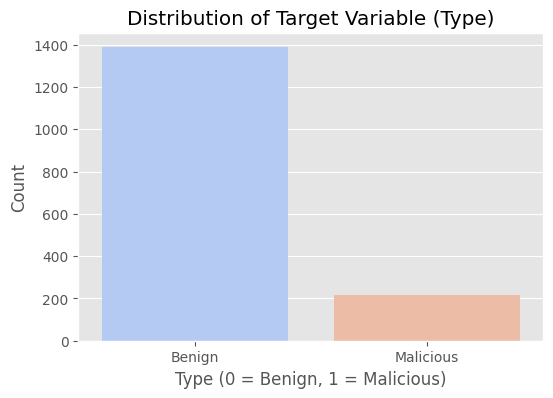

In [33]:
# Set the plot style to "ggplot" for a cleaner and more visually appealing look
plt.style.use("ggplot")

# Create a figure with a fixed size of 6x4 inches
plt.figure(figsize=(6, 4))

# Plot a countplot to show the distribution of the target variable ('Type')
sns.countplot(x=df["Type"], palette="coolwarm")  # Uses the "coolwarm" color palette for better visualization

# Set the title of the plot
plt.title("Distribution of Target Variable (Type)")

# Label the x-axis to indicate what "Type" represents
plt.xlabel("Type (0 = Benign, 1 = Malicious)")

# Label the y-axis to show the count of each class
plt.ylabel("Count")

# Manually set x-axis labels for clarity (0 = Benign, 1 = Malicious)
plt.xticks([0, 1], ["Benign", "Malicious"])

# Display the plot
plt.show()

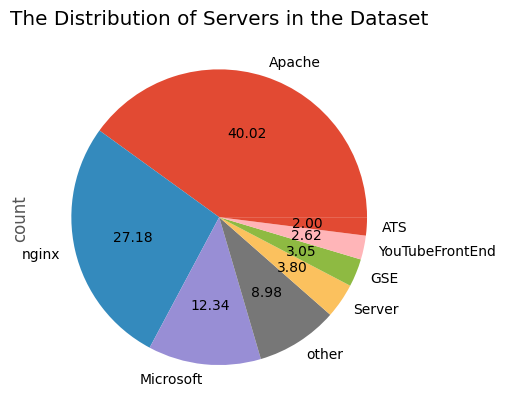

In [34]:
# Plotting a pie chart to visualize the distribution of values in the "SERVER" column
# - autopct='%.2f' formats the percentage values displayed on the pie chart to 2 decimal places.
df['SERVER'].value_counts().plot.pie(autopct='%.2f')

# Adding a title to the pie chart for context
plt.title("The Distribution of Servers in the Dataset")

# Displaying the pie chart
plt.show()

C:\Users\araki\AppData\Local\Temp\ipykernel_12492\333376318.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=xs, y=ys, palette="pastel", edgecolor="black")  # Create the barplot with pastel colors and black edges


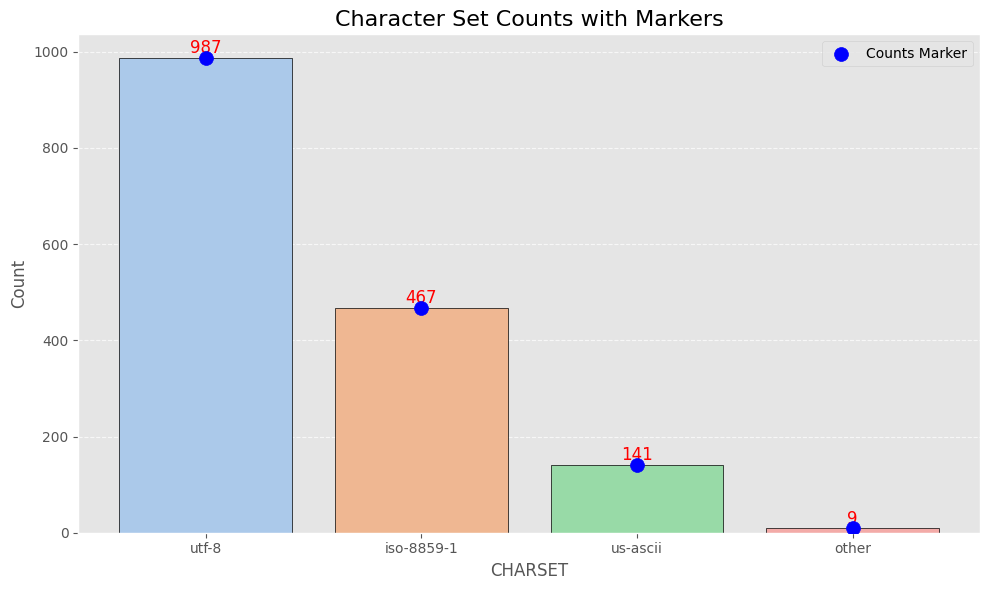

In [35]:
# Count the occurrences in the "CHARSET" column
ys = df["CHARSET"].value_counts()  # Get the frequency of each unique charset
xs = df["CHARSET"].value_counts().index  # Get the unique charset values (for x-axis)

# Plotting the bar chart
plt.figure(figsize=(10, 6))  # Set the figure size for the plot
sns.barplot(x=xs, y=ys, palette="pastel", edgecolor="black")  # Create the barplot with pastel colors and black edges

# Adding text annotations above the bars to show the counts
for x, y in zip(range(len(xs)), ys):
    plt.text(x, y + 10, str(y), color="red", fontsize=12, ha="center")  # Display the count above each bar in red

# Adding markers on top of the bars to highlight the counts
plt.scatter(range(len(xs)), ys, color="blue", s=100, zorder=5, label="Counts Marker")  # Scatter plot on top of bars

# Customizing the plot's appearance
plt.title("Character Set Counts with Markers", fontsize=16)  # Set plot title
plt.xlabel("CHARSET", fontsize=12)  # Set x-axis label
plt.ylabel("Count", fontsize=12)  # Set y-axis label
plt.xticks(fontsize=10)  # Set font size for x-axis labels
plt.yticks(fontsize=10)  # Set font size for y-axis labels
plt.legend()  # Display the legend
plt.grid(axis="y", linestyle="--", alpha=0.7)  # Add grid lines for the y-axis with dashed style
plt.tight_layout()  # Adjust layout for better fitting
plt.show()  # Display the plot

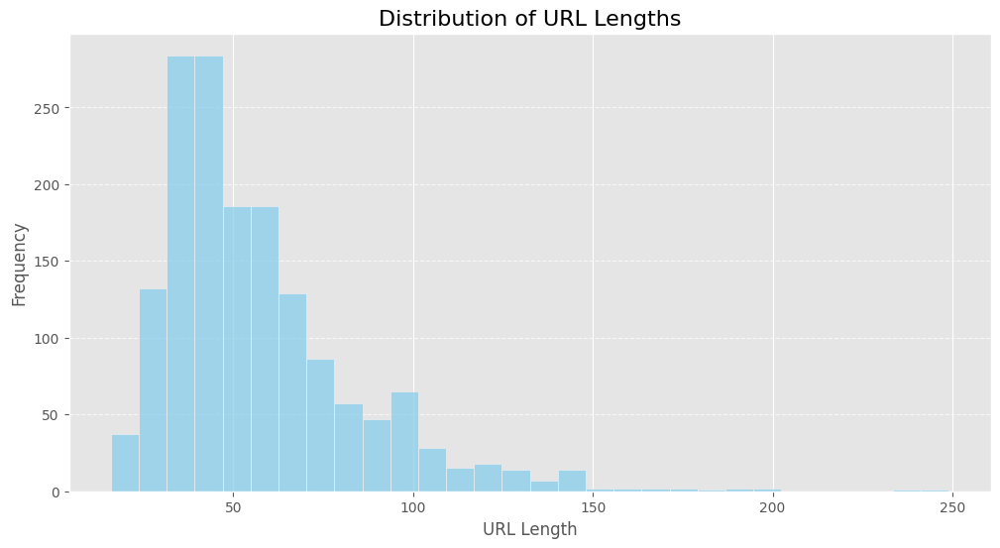

In [36]:
# Plotting a histogram to visualize the distribution of URL lengths
# - figsize=(12, 6): Specifies the size of the plot (12 inches wide, 6 inches tall).
# - bins=30: Specifies the number of bins for the histogram.
# - kde=False: Disables the Kernel Density Estimate (KDE) line, showing only the histogram bars.
# - color='skyblue': Sets the color of the bars to sky blue.
plt.figure(figsize=(12, 6))

# Creating the histogram for the "URL_LENGTH" column
sns.histplot(df['URL_LENGTH'], bins=30, kde=False, color='skyblue')

# Adding a title to the plot
plt.title('Distribution of URL Lengths', fontsize=16)

# Labeling the x-axis and y-axis
plt.xlabel('URL Length', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# Adding grid lines on the y-axis for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Displaying the plot
plt.show()

C:\Users\araki\AppData\Local\Temp\ipykernel_12492\1556770119.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df["Type"], y=df[feature], palette="coolwarm")
C:\Users\araki\AppData\Local\Temp\ipykernel_12492\1556770119.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df["Type"], y=df[feature], palette="coolwarm")
C:\Users\araki\AppData\Local\Temp\ipykernel_12492\1556770119.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df["Type"], y=df[feature], palette="coolwarm")
C:\Users\araki\AppData\Local\Temp\ipykernel_12492\15567701

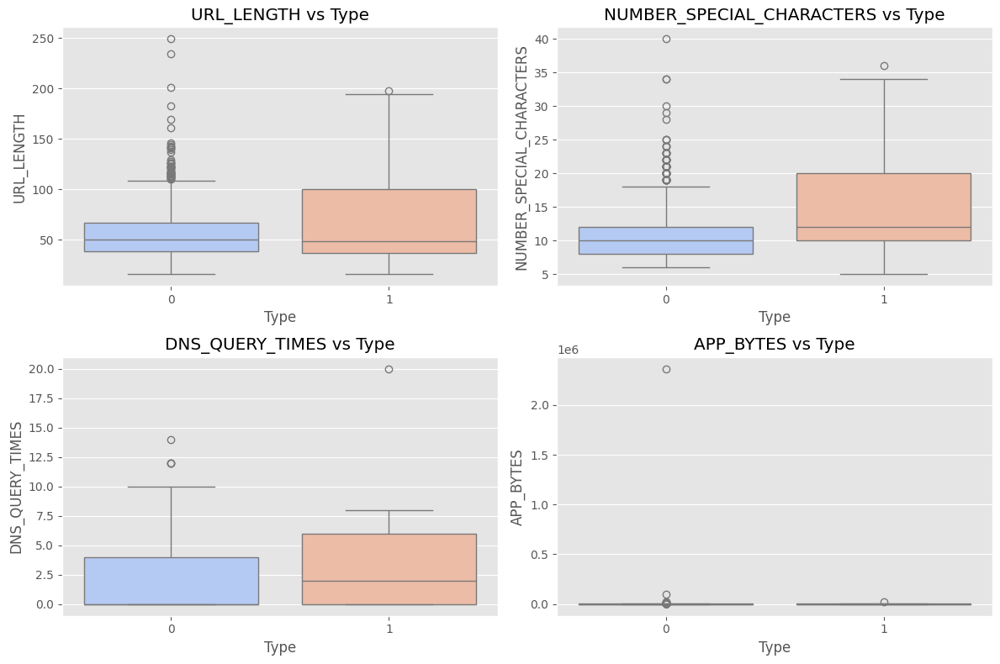

In [37]:
# Select important features for visualization
key_features = ["URL_LENGTH", "NUMBER_SPECIAL_CHARACTERS", "DNS_QUERY_TIMES", "APP_BYTES"]

# Set the figure size to 12x8 inches for better visibility
plt.figure(figsize=(12, 8))

# Loop through the selected key features and create subplots
for i, feature in enumerate(key_features, 1):  # Enumerate starts from 1 for subplot indexing
    plt.subplot(2, 2, i)  # Create a 2x2 grid of subplots
    
    # Create a boxplot to show the distribution of the feature for each Type (Benign/Malicious)
    sns.boxplot(x=df["Type"], y=df[feature], palette="coolwarm")
    
    # Set the title of the subplot to indicate the relationship being visualized
    plt.title(f"{feature} vs Type")

# Adjust subplot spacing to prevent overlap
plt.tight_layout()

# Display the plots
plt.show()

<Figure size 1400x600 with 0 Axes>

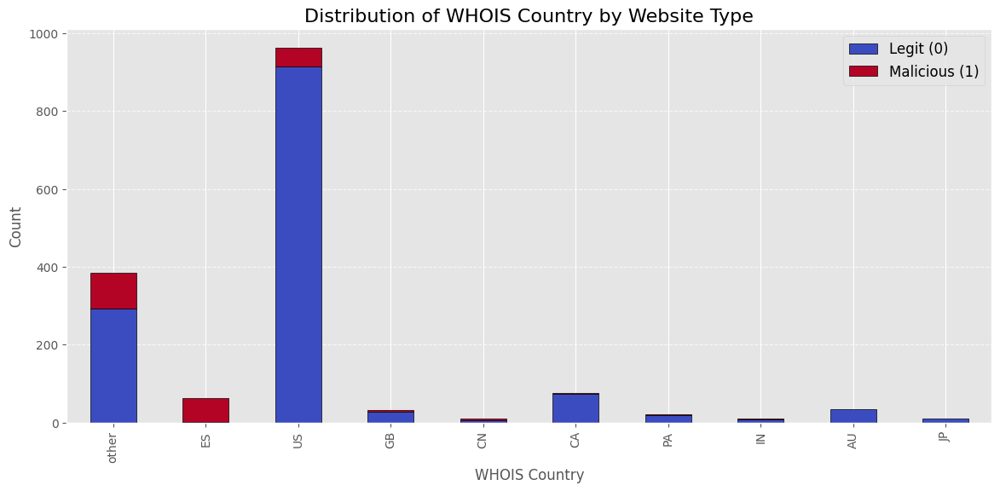

In [38]:
# Count occurrences of WHOIS_COUNTRY for each Type (Legit vs Malicious)
whois_counts = df.groupby("WHOIS_COUNTRY")["Type"].value_counts().unstack().fillna(0)

# Sort by highest malicious count
whois_counts = whois_counts.sort_values(by=1, ascending=False)

# Plot the stacked bar chart
plt.figure(figsize=(14,6))
whois_counts.plot(kind="bar", stacked=True, figsize=(14,6), colormap="coolwarm", edgecolor="black")

# Chart formatting
plt.title("Distribution of WHOIS Country by Website Type", fontsize=16)
plt.xlabel("WHOIS Country", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.xticks(rotation=90, fontsize=10)
plt.yticks(fontsize=10)
plt.legend(["Legit (0)", "Malicious (1)"], fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

In [39]:
# Displaying the amount of malicious and benign websites for ES.
es_df = df[df["WHOIS_COUNTRY"] == "ES"]
es_comparison = es_df.groupby("Type").size().reset_index(name="Count")
print(es_comparison)

   Type  Count
0     0      1
1     1     62


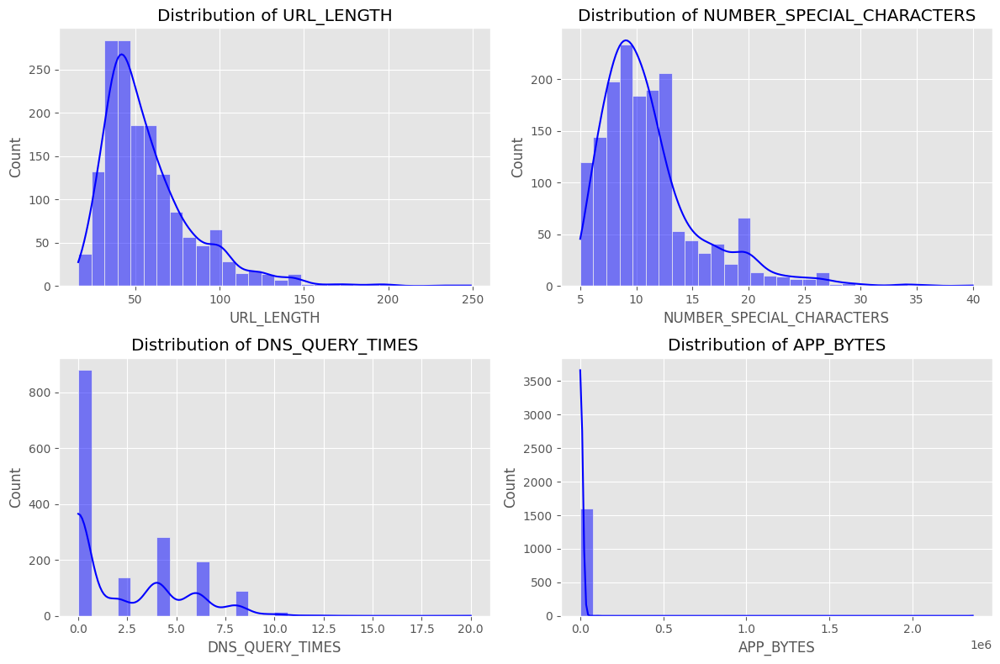

In [40]:
# Set the figure size to 12x8 inches for better visibility
plt.figure(figsize=(12, 8))

# Loop through the selected key features and create subplots
for i, feature in enumerate(key_features, 1):  # Enumerate starts from 1 for subplot indexing
    plt.subplot(2, 2, i)  # Create a 2x2 grid of subplots, placing each feature in a separate plot
    
    # Plot the histogram for the current feature with 30 bins and KDE (Kernel Density Estimate) enabled
    sns.histplot(df[feature], bins=30, kde=True, color="blue")
    
    # Set the title of the subplot to indicate which feature is being plotted
    plt.title(f"Distribution of {feature}")

# Adjust subplot spacing to prevent overlap
plt.tight_layout()

# Display the plots
plt.show()

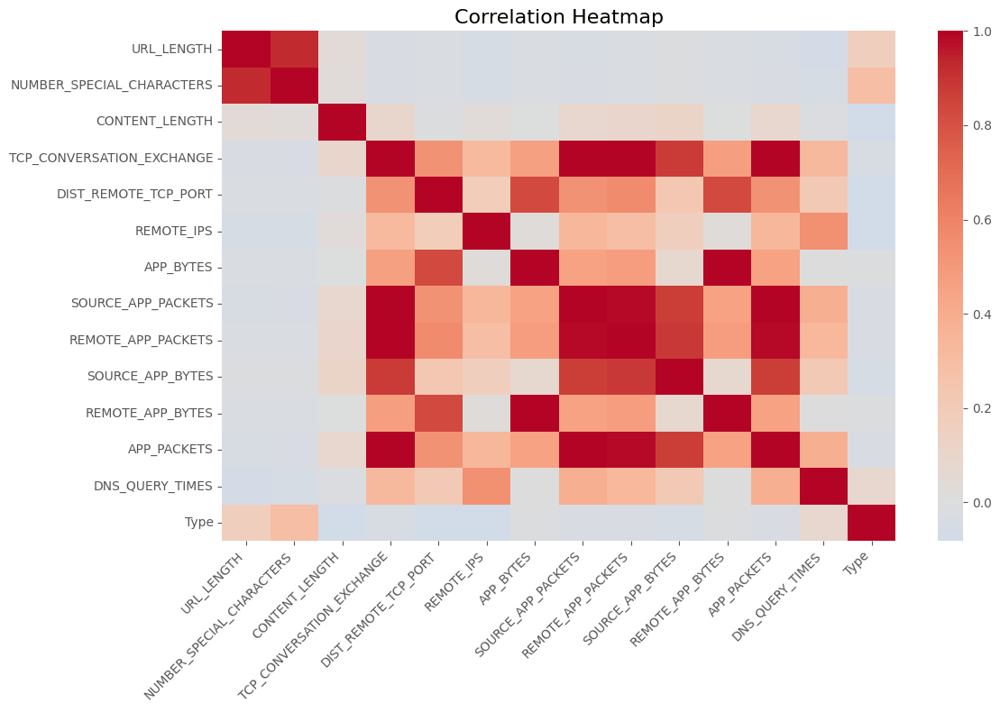

In [41]:
# Compute the correlation matrix for numerical columns in the DataFrame
# - numeric_only=True ensures only numeric columns are included in the correlation computation.
correlation_matrix = df.corr(numeric_only=True)

# Create the heatmap to visualize the correlation matrix
# - figsize=(12, 8): Specifies the figure size (12 inches wide, 8 inches tall).
plt.figure(figsize=(12, 8))

# Generate the heatmap using the seaborn library
sns.heatmap(
    correlation_matrix,  # Data to be visualized in the heatmap
    annot=False,  # Used so that the correlation values are not displayed in each cell to avoid crowding.
    cmap='coolwarm',  # Color scheme for the heatmap, with warm colors for positive and cool for negative correlations
    center=0,  # Center the colormap at 0 to highlight negative and positive correlations equally
    cbar=True  # Show the color bar to indicate the correlation range
)

# Customize the plot for better readability
plt.title("Correlation Heatmap", fontsize=16)  # Title for the heatmap
plt.xticks(rotation=45, fontsize=10, ha='right')  # Rotate x-axis labels for better clarity
plt.yticks(fontsize=10)  # Set font size for y-axis labels
plt.tight_layout()  # Adjust layout to ensure everything fits without overlap

# Display the heatmap
plt.show()


In [42]:
yp.ProfileReport(df) # Generate automated EDA report using pandas-profiling.

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [43]:
df_testing = df # Saves a copy of dataframe before commencing feature engineering

### Feature Engineering

In [44]:
# Define the list of columns to be scaled
# These are numerical columns that will undergo standardization to have a mean of 0 and a standard deviation of 1.
columns_to_scale = ["CONTENT_LENGTH", "WHOIS_REGDATE", "WHOIS_UPDATED_DATE", "DNS_QUERY_TIMES",
                    "URL_LENGTH", "NUMBER_SPECIAL_CHARACTERS", "TCP_CONVERSATION_EXCHANGE",
                    "DIST_REMOTE_TCP_PORT", "REMOTE_IPS", "APP_BYTES", "SOURCE_APP_PACKETS",
                    "REMOTE_APP_PACKETS", "SOURCE_APP_BYTES", "REMOTE_APP_BYTES",
                    "APP_PACKETS"]

# Convert the "WHOIS_REGDATE" and "WHOIS_UPDATED_DATE" columns from datetime to integer format
# This is done by viewing them as int64, representing the date as the number of nanoseconds since epoch.
df["WHOIS_REGDATE"] = df["WHOIS_REGDATE"].view("int64")
df["WHOIS_UPDATED_DATE"] = df["WHOIS_UPDATED_DATE"].view("int64")

# Initialize the StandardScaler to standardize the selected columns
# - StandardScaler scales the features by removing the mean and scaling to unit variance.
sc = StandardScaler()

# Apply the StandardScaler to the columns listed in columns_to_scale
# - The scaled data replaces the original values in the DataFrame.
scaled_columns = sc.fit_transform(df[columns_to_scale])

# Update the original DataFrame with the scaled values
df[columns_to_scale] = scaled_columns

# Display the first 5 rows of the scaled columns to verify the transformation
df[columns_to_scale].head()

C:\Users\araki\AppData\Local\Temp\ipykernel_12492\3933365292.py:11: FutureWarning: Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.
  df["WHOIS_REGDATE"] = df["WHOIS_REGDATE"].view("int64")
C:\Users\araki\AppData\Local\Temp\ipykernel_12492\3933365292.py:12: FutureWarning: Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.
  df["WHOIS_UPDATED_DATE"] = df["WHOIS_UPDATED_DATE"].view("int64")


,CONTENT_LENGTH,WHOIS_REGDATE,WHOIS_UPDATED_DATE,DNS_QUERY_TIMES,URL_LENGTH,NUMBER_SPECIAL_CHARACTERS,TCP_CONVERSATION_EXCHANGE,DIST_REMOTE_TCP_PORT,REMOTE_IPS,APP_BYTES,SOURCE_APP_PACKETS,REMOTE_APP_PACKETS,SOURCE_APP_BYTES,REMOTE_APP_BYTES,APP_PACKETS
0,-0.283979,2.589396,0.333190,-0.066028,-1.485550,-0.926963,-0.215960,-0.231464,-0.305904,-0.040199,-0.215470,-0.178805,-0.210255,-0.040806,-0.215470
1,0.348710,-0.262823,0.333190,-0.779219,-1.485550,-1.147891,0.025064,0.096057,0.293205,-0.031221,-0.027214,0.012256,-0.208612,-0.034064,-0.027214
2,-0.281376,-0.262823,0.333190,-0.779219,-1.485550,-1.147891,-0.384676,-0.231464,-0.905013,-0.052056,-0.427258,-0.391095,-0.227172,-0.054898,-0.427258
3,-0.288290,-0.895472,-2.565208,2.073544,-1.449576,-1.147891,0.362497,0.797886,-0.006350,0.012514,0.490489,0.394378,0.048432,0.019291,0.490489
5,-0.216118,2.747294,0.443631,-0.779219,-1.413601,-0.926963,-0.119550,0.049268,1.790977,-0.036913,-0.168406,-0.115118,-0.214877,-0.039755,-0.168406


In [45]:
# Define a list of categorical columns
# These columns contain categorical data such as text labels or codes representing different categories.
categorical_columns = ["CHARSET", "SERVER", "WHOIS_COUNTRY", "WHOIS_STATEPRO"]

In [46]:
# Loop through each column in the categorical_columns list to apply one-hot encoding
# One-hot encoding creates binary columns for each category, which will replace the original categorical column.

for col in categorical_columns:
    # Use pd.get_dummies to perform one-hot encoding on the column
    # - prefix=col: The new columns will have a prefix corresponding to the original column name.
    df = pd.concat([df, pd.get_dummies(df[col], prefix=col)], axis=1)
    
    # Drop the original categorical column after encoding it
    df.drop(columns=[col], inplace=True)

# Display the first 5 rows of the modified DataFrame
df.head()

,URL,URL_LENGTH,NUMBER_SPECIAL_CHARACTERS,CONTENT_LENGTH,WHOIS_REGDATE,WHOIS_UPDATED_DATE,TCP_CONVERSATION_EXCHANGE,DIST_REMOTE_TCP_PORT,REMOTE_IPS,APP_BYTES,...,WHOIS_STATEPRO_PRAHA,WHOIS_STATEPRO_Quebec,WHOIS_STATEPRO_Queensland,WHOIS_STATEPRO_TX,WHOIS_STATEPRO_UK,WHOIS_STATEPRO_UT,WHOIS_STATEPRO_VA,WHOIS_STATEPRO_WA,WHOIS_STATEPRO_WI,WHOIS_STATEPRO_other
0,M0_109,-1.485550,-0.926963,-0.283979,2.589396,0.333190,-0.215960,-0.231464,-0.305904,-0.040199,...,False,False,False,False,False,False,False,False,False,True
1,B0_2314,-1.485550,-1.147891,0.348710,-0.262823,0.333190,0.025064,0.096057,0.293205,-0.031221,...,False,False,False,False,False,False,False,False,False,True
2,B0_911,-1.485550,-1.147891,-0.281376,-0.262823,0.333190,-0.384676,-0.231464,-0.905013,-0.052056,...,False,False,False,False,False,False,False,False,False,True
3,B0_113,-1.449576,-1.147891,-0.288290,-0.895472,-2.565208,0.362497,0.797886,-0.006350,0.012514,...,False,False,False,False,False,False,False,False,False,True
5,B0_2064,-1.413601,-0.926963,-0.216118,2.747294,0.443631,-0.119550,0.049268,1.790977,-0.036913,...,False,False,False,False,False,False,False,False,False,True


In [47]:
df.shape # Returns a tuple with the number of rows and columns in the DataFrame.

(1604, 71)

In [48]:
# Drop the "URL" column from the DataFrame
# - axis=1 specifies that a column is being dropped.
df = df.drop("URL", axis=1)

In [49]:
# Reset the index of the DataFrame
# - drop=True ensures the old index is not added as a column.
# - inplace=True modifies the original DataFrame directly.
df.reset_index(drop=True, inplace=True)

# Display the first 5 rows of the DataFrame to verify the index reset
df.head()

,URL_LENGTH,NUMBER_SPECIAL_CHARACTERS,CONTENT_LENGTH,WHOIS_REGDATE,WHOIS_UPDATED_DATE,TCP_CONVERSATION_EXCHANGE,DIST_REMOTE_TCP_PORT,REMOTE_IPS,APP_BYTES,SOURCE_APP_PACKETS,...,WHOIS_STATEPRO_PRAHA,WHOIS_STATEPRO_Quebec,WHOIS_STATEPRO_Queensland,WHOIS_STATEPRO_TX,WHOIS_STATEPRO_UK,WHOIS_STATEPRO_UT,WHOIS_STATEPRO_VA,WHOIS_STATEPRO_WA,WHOIS_STATEPRO_WI,WHOIS_STATEPRO_other
0,-1.485550,-0.926963,-0.283979,2.589396,0.333190,-0.215960,-0.231464,-0.305904,-0.040199,-0.215470,...,False,False,False,False,False,False,False,False,False,True
1,-1.485550,-1.147891,0.348710,-0.262823,0.333190,0.025064,0.096057,0.293205,-0.031221,-0.027214,...,False,False,False,False,False,False,False,False,False,True
2,-1.485550,-1.147891,-0.281376,-0.262823,0.333190,-0.384676,-0.231464,-0.905013,-0.052056,-0.427258,...,False,False,False,False,False,False,False,False,False,True
3,-1.449576,-1.147891,-0.288290,-0.895472,-2.565208,0.362497,0.797886,-0.006350,0.012514,0.490489,...,False,False,False,False,False,False,False,False,False,True
4,-1.413601,-0.926963,-0.216118,2.747294,0.443631,-0.119550,0.049268,1.790977,-0.036913,-0.168406,...,False,False,False,False,False,False,False,False,False,True


In [50]:
# Print the number of rows before dropping duplicates
# - len(df) returns the number of rows in the DataFrame.
print("Before dropping duplicates: {}".format(len(df)))

# Drop duplicate rows from the DataFrame
# - inplace=True modifies the DataFrame directly, removing rows that are identical.
df.drop_duplicates(inplace=True)

# Print the number of rows after dropping duplicates to show the change
print("After dropping duplicates: {}".format(len(df)))

Before dropping duplicates: 1604
After dropping duplicates: 1559


### Machine Learning

#### Logistic Regression

In [51]:
# Define the target variable (y) and feature set (x)
# - 'Type' is the target variable, and all other columns are considered features.
y = df['Type']
x = df.drop(['Type'], axis=1)

# Split the data into training and testing sets
# - test_size=0.25: 25% of the data will be used for testing, and 75% for training.
# - random_state=42 ensures reproducibility of the split.
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.25, random_state=42)

# Create an instance of SMOTE 
# sampling_strategy='auto' means it will balance the dataset by making the minority class as frequent as the majority class.
# random_state=42 ensures reproducibility.
smote = SMOTE(sampling_strategy='auto', random_state=42)
# fit_resample() generates synthetic samples for the minority class and returns the new balanced dataset.
xtrain, ytrain = smote.fit_resample(xtrain, ytrain)

C:\Users\araki\AppData\Local\Programs\Python\Python312\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\araki\AppData\Local\Programs\Python\Python312\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


In [52]:
# Print the shapes of the training and testing sets for features (x) and target variable (y)
# - xtrain and xtest represent the feature sets for training and testing.
# - ytrain and ytest represent the target variable sets for training and testing.
print("Shape of the x Train :", xtrain.shape)
print("Shape of the y Train :", ytrain.shape)
print("Shape of the x test :", xtest.shape)
print("Shape of the y test :", ytest.shape)

Shape of the x Train : (2056, 69)
Shape of the y Train : (2056,)
Shape of the x test : (390, 69)
Shape of the y test : (390,)


In [53]:
# Initialize a Logistic Regression model
LR = LogisticRegression()

In [54]:
# Train the Logistic Regression model using the training data
# - xtrain: The feature set for training.
# - ytrain: The target variable for training.
LR.fit(xtrain, ytrain)

LogisticRegression()

In [55]:
# Make predictions using the trained Logistic Regression model on the test data
# - xtest: The feature set for testing.
# pred_LR: The predicted target values based on the test features.
pred_LR = LR.predict(xtest)

In [56]:
# Print the accuracy score of the Logistic Regression model
# - accuracy_score compares the true labels (ytest) with the predicted labels (pred_LR).
print(f'The Accuracy Score Is : {accuracy_score(ytest,pred_LR) * 100}%')

# Print the confusion matrix to evaluate the model's performance
# - confusion_matrix shows the number of true positives (TP), true negatives (TN), false positives (FP), and false negatives (FN).
# - returns a 2x2 matrix of the form:
#   [[TN  FP]
#    [FN  TP]]
print('--------------------------')
print(confusion_matrix(ytest,pred_LR))

# Print the classification report to get detailed metrics like precision, recall, and F1-score
print('--------------------------')
print(classification_report(ytest,pred_LR))

The Accuracy Score Is : 91.28205128205128%
--------------------------
[[316  24]
 [ 10  40]]
--------------------------
              precision    recall  f1-score   support

           0       0.97      0.93      0.95       340
           1       0.62      0.80      0.70        50

    accuracy                           0.91       390
   macro avg       0.80      0.86      0.83       390
weighted avg       0.93      0.91      0.92       390



In [57]:
# Create a DataFrame to visualize the confusion matrix
# - The DataFrame is labeled for better understanding of the matrix:
#   - 'actual_no' and 'actual_yes' represent the actual classes (True labels).
#   - 'predicted_no' and 'predicted_yes' represent the predicted classes (Predicted labels).
confused = pd.DataFrame(confusion_matrix(ytest, pred_LR), index=['actual_no','actual_yes'], columns=['predicted_no','predicted_yes'])

# Display the confusion matrix in a more readable format
confused

,predicted_no,predicted_yes
actual_no,316,24
actual_yes,10,40


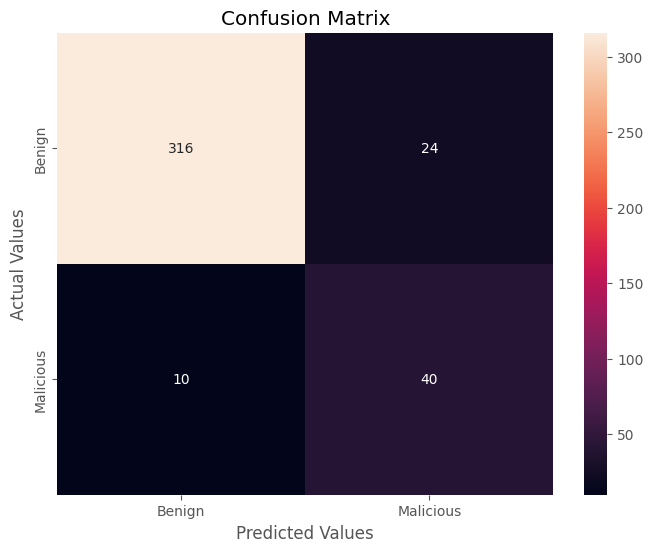

In [58]:
# Generate the confusion matrix for the predictions
cm = confusion_matrix(ytest, pred_LR)

# Plot the confusion matrix using a heatmap from Seaborn for better visualization
# - annot=True displays the numerical values in each cell of the heatmap.
# - fmt="d" formats the annotations as integers.
# - cmap="rocket" sets the color scheme for the heatmap.
# - cbar=True includes the color bar on the side.
# - xticklabels and yticklabels label the axes with "Benign" and "Malicious" for better clarity.
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="rocket", cbar=True, xticklabels=["Benign", "Malicious"], yticklabels=["Benign", "Malicious"])
plt.title("Confusion Matrix")
plt.xlabel("Predicted Values")
plt.ylabel("Actual Values")
plt.show()

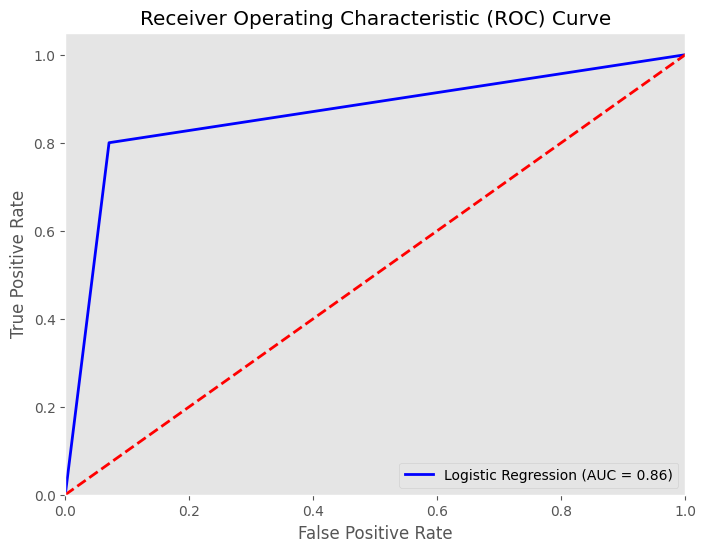

In [59]:
# Compute ROC curve and ROC area for the Logistic Regression model
fpr, tpr, _ = roc_curve(ytest, pred_LR)  # False Positive Rate, True Positive Rate
roc_auc = auc(fpr, tpr)  # Compute AUC

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'Logistic Regression (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--', lw=2)  # Diagonal reference line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()

# Show the plot
plt.show()

#### Random Forest Classification

In [60]:
# Initialize the RandomForestClassifier with 100 trees and a fixed random_state for reproducibility
# - n_estimators=100: Specifies the number of trees in the forest.
# - random_state=42: Ensures the randomness is the same for each run.
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the Random Forest model to the training data
# - random_x_train and random_y_train: The features and target variable for training.
rf_classifier.fit(xtrain, ytrain)

# Make predictions using the trained Random Forest model on the test data
# - random_x_test: The feature set for testing.
random_y_pred = rf_classifier.predict(xtest)

In [61]:
random_y_pred # View the predicted values for the test set

array([1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1,

In [62]:
# Calculate the accuracy of the RandomForestClassifier on the test set
# - accuracy_score compares the predicted values (random_y_pred) with the actual values (random_y_test)
accuracy = accuracy_score(ytest, random_y_pred)

# Generate the classification report, which includes precision, recall, f1-score, and support for each class
classification_rep = classification_report(ytest, random_y_pred)

# Print the accuracy score and the classification report
# - accuracy_score returns the proportion of correct predictions.
# - classification_report summarizes the performance of the classifier for each class.
print(f'The Accuracy Score Is : {accuracy * 100}%')
print('--------------------------')
print("\nClassification Report:\n", classification_rep)

# Sample prediction on the first row of the test set
# - random_x_test.iloc[0:1] selects the first row of the test set as a DataFrame for prediction
# - The model predicts the class for this single sample.
sample = xtest.iloc[0:1]  # Keep as DataFrame to match model input format
prediction = rf_classifier.predict(sample)

# Print the predicted class for the sample
print("\nSample Prediction:", prediction)

The Accuracy Score Is : 95.12820512820512%
--------------------------

Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.97      0.97       340
           1       0.79      0.84      0.82        50

    accuracy                           0.95       390
   macro avg       0.88      0.90      0.89       390
weighted avg       0.95      0.95      0.95       390


Sample Prediction: [1]


In [63]:
# Convert the first row of the test data (df_testing) into a dictionary to view the feature values
sample_dict = df_testing.iloc[0].to_dict()

# Print the feature values for the first website in the test set
print(f"\nSample Website: {sample_dict}")

# Print whether the model predicted the website as malicious or not
# - If prediction[0] == 0: It's "Not Malicious" (0 indicates a benign website)
# - If prediction[0] == 1: It's "Malicious" (1 indicates a malicious website)
print(f"Predicted Malicious: {'Not Malicious' if prediction[0] == 0 else 'Malicious'}")


Sample Website: {'URL': 'M0_109', 'URL_LENGTH': -1.485550354206278, 'NUMBER_SPECIAL_CHARACTERS': -0.9269629513709726, 'CHARSET': 'iso-8859-1', 'SERVER': 'nginx', 'CONTENT_LENGTH': -0.28397911257654906, 'WHOIS_COUNTRY': 'other', 'WHOIS_STATEPRO': 'other', 'WHOIS_REGDATE': 2.5893963323166163, 'WHOIS_UPDATED_DATE': 0.3331898951751583, 'TCP_CONVERSATION_EXCHANGE': -0.21595963585626, 'DIST_REMOTE_TCP_PORT': -0.23146359382529794, 'REMOTE_IPS': -0.30590409959794285, 'APP_BYTES': -0.04019899502474316, 'SOURCE_APP_PACKETS': -0.21547007875140317, 'REMOTE_APP_PACKETS': -0.17880541504113895, 'SOURCE_APP_BYTES': -0.21025513167189952, 'REMOTE_APP_BYTES': -0.0408055859639889, 'APP_PACKETS': -0.21547007875140317, 'DNS_QUERY_TIMES': -0.0660279381740184, 'Type': 1}
Predicted Malicious: Malicious


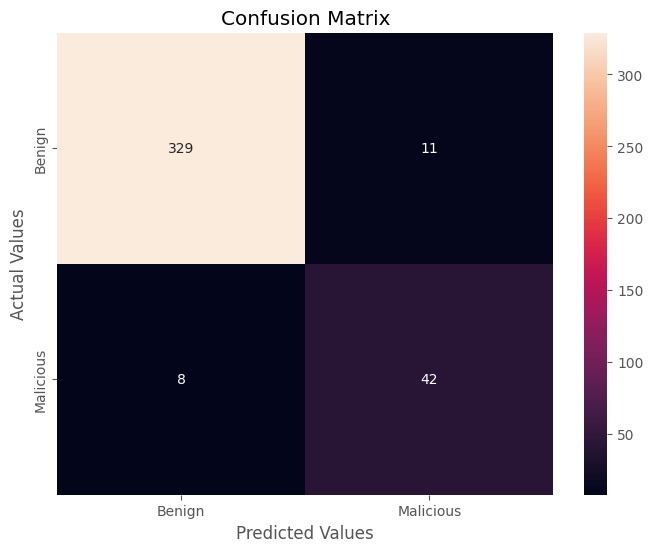

In [64]:
# Create a confusion matrix to compare the actual values (random_y_test) with the predicted values (random_y_pred)
# - confusion_matrix generates a matrix that shows True Positives (TP), False Positives (FP), False Negatives (FN), and True Negatives (TN).
cm = confusion_matrix(ytest, random_y_pred)

# Plot the confusion matrix using Seaborn to visually evaluate the model's performance
# - annot=True displays the numerical values in the heatmap cells.
# - fmt="d" formats the annotations as integers.
# - cmap="rocket" specifies the color map for the heatmap.
# - cbar=True adds a color bar to the plot for reference.
plt.figure(figsize=(8, 6))  # Set the figure size for better readability
sns.heatmap(cm, annot=True, fmt="d", cmap="rocket", cbar=True, xticklabels=["Benign", "Malicious"], yticklabels=["Benign", "Malicious"])

# Add a title and axis labels to the plot for better clarity
plt.title("Confusion Matrix")
plt.xlabel("Predicted Values")
plt.ylabel("Actual Values")

# Display the plot
plt.show()

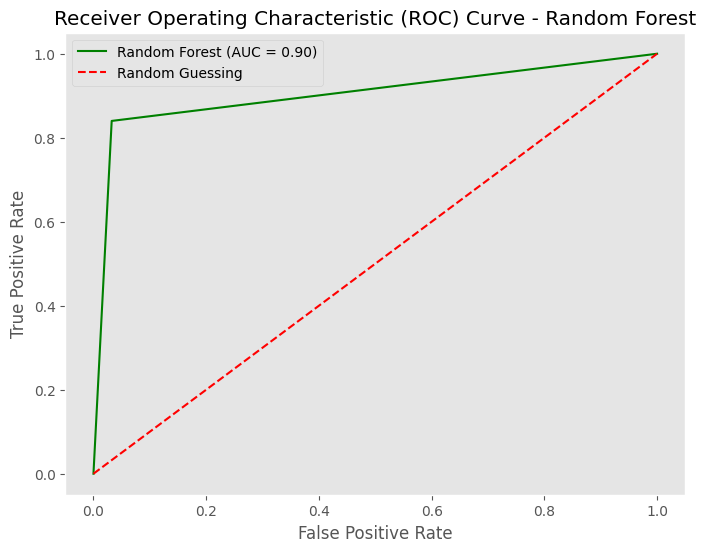

In [65]:
# Compute ROC curve and AUC score
fpr_rf, tpr_rf, _ = roc_curve(ytest, random_y_pred)
auc_rf = auc(fpr_rf, tpr_rf)

# Plot the ROC curve for Random Forest
plt.figure(figsize=(8, 6))
plt.plot(fpr_rf, tpr_rf, color='green', label=f'Random Forest (AUC = {auc_rf:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='red', label="Random Guessing")

# Formatting the plot
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve - Random Forest")
plt.legend()
plt.grid()
plt.show()

#### K-Nearest Neighbor Classification

In [66]:
# Initializing the KNeighborsClassifier with n_neighbors set to 5
# - n_neighbors=5 specifies that the classifier will consider the 5 nearest neighbors to make predictions.
# - fit() trains the model on the training data (X_train, y_train).
knn_regressor = KNeighborsClassifier(n_neighbors=5)
knn_regressor.fit(xtrain, ytrain)

KNeighborsClassifier()

In [67]:
# Using the trained KNN model to make predictions on the test data (X_test)
# - predict() uses the model to predict the target variable (y) for the test features (X_test).
y_pred = knn_regressor.predict(xtest)

# Displaying the predictions
y_pred

array([1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0,
       1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1,

In [68]:
# Calculating and displaying the performance metrics for the KNN model
# - accuracy_score() gives the percentage of correct predictions.
# - mean_squared_error() calculates the average squared difference between predicted and actual values.
# - mean_absolute_error() calculates the average of the absolute differences between predicted and actual values.
# - r2_score() provides a measure of how well the model explains the variance in the data (coefficient of determination).

print(f'The Accuracy Score Is : {accuracy_score(ytest, y_pred) * 100}%')  # Accuracy of the predictions
print('--------------------------')
print(f"Mean Squared Error: {mean_squared_error(ytest, y_pred):.2f}")  # Measures the quality of the regression model
print(f"Mean Absolute Error: {mean_absolute_error(ytest, y_pred):.2f}")  # Indicates the average prediction error
print(f"R2 Score: {r2_score(ytest, y_pred):.2f}")  # Indicates the proportion of variance explained by the model

The Accuracy Score Is : 88.2051282051282%
--------------------------
Mean Squared Error: 0.12
Mean Absolute Error: 0.12
R2 Score: -0.06


In [69]:
# Generate the classification report, which includes precision, recall, f1-score, and support for each class
classification_rep = classification_report(ytest, y_pred)

print('--------------------------')
print("\nClassification Report:\n", classification_rep)

--------------------------

Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.89      0.93       340
           1       0.52      0.86      0.65        50

    accuracy                           0.88       390
   macro avg       0.75      0.87      0.79       390
weighted avg       0.92      0.88      0.89       390



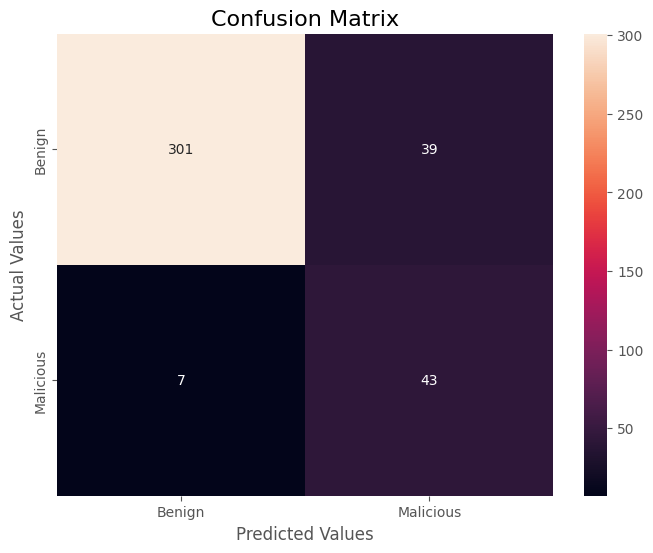

In [70]:
# Plotting the confusion matrix using Seaborn to visualize the classification performance
# The confusion matrix provides a comparison between predicted and actual values (True Positive, True Negative, False Positive, False Negative).

cm = confusion_matrix(ytest, y_pred)  # Generate the confusion matrix

# Plotting the confusion matrix with annotations for clarity
plt.figure(figsize=(8, 6))
sns.heatmap(
    cm, 
    annot=True,        # Annotate the matrix with the actual counts
    fmt="d",           # Format as integers
    cmap="rocket",     # Choose the color palette for the heatmap
    cbar=True,         # Display color bar
    xticklabels=["Benign", "Malicious"],  # Labels for predicted values
    yticklabels=["Benign", "Malicious"]   # Labels for actual values
)

# Adding title and labels for better readability
plt.title("Confusion Matrix", fontsize=16)
plt.xlabel("Predicted Values", fontsize=12)
plt.ylabel("Actual Values", fontsize=12)
plt.show()  # Display the plot

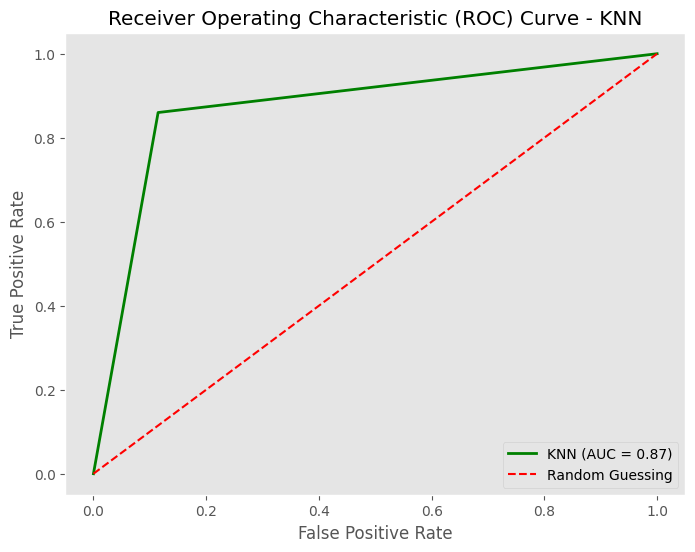

In [71]:
# Compute the ROC curve
fpr_knn, tpr_knn, _ = roc_curve(ytest, y_pred)
roc_auc_knn = auc(fpr_knn, tpr_knn)

# Plot the ROC curve for KNN
plt.figure(figsize=(8,6))
plt.plot(fpr_knn, tpr_knn, color='green', lw=2, label=f'KNN (AUC = {roc_auc_knn:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label="Random Guessing")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve - KNN")
plt.legend(loc="lower right")
plt.grid()
plt.show()

### SHapley Additive exPlanations (SHAP) Analysis (Using XGBoost)

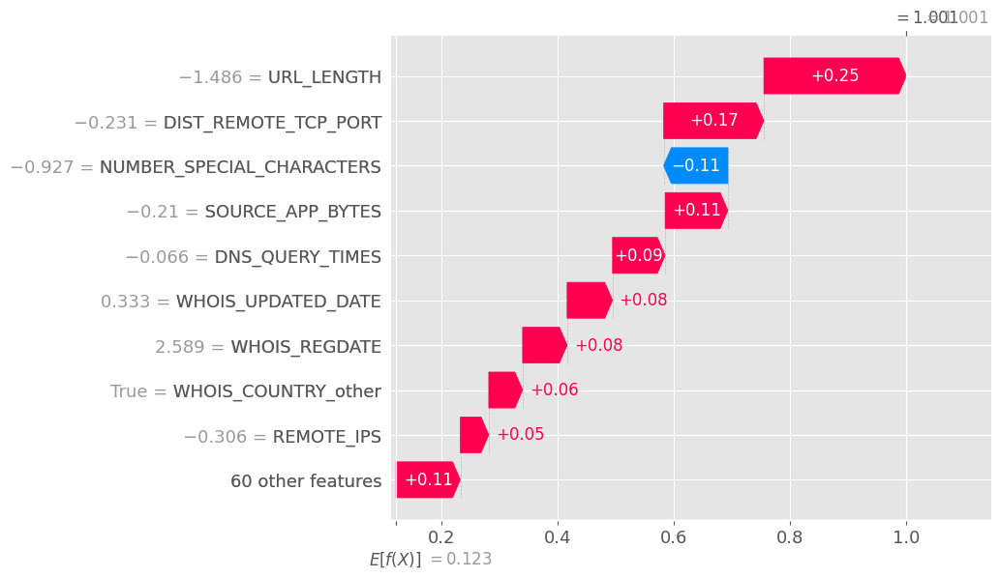

In [72]:
# No need for train-test splits since we are analyzing the entire test dataset.
y = df['Type']  # Extract the target variable.
X = df.drop(['Type'], axis=1)  # Remove the target column to get feature variables.
X = pd.get_dummies(X)  # Convert categorical variables into numerical representations.

# Train an XGBoost regressor model using the entire dataset.
model = XGBRegressor().fit(X, y)

# Initialize the SHAP explainer for interpreting model predictions.
explainer = shap.Explainer(model)  
shap_values = explainer(X)  # Compute SHAP values for all instances.

# Generate a SHAP waterfall plot for the first instance to visualize feature contributions.
shap.plots.waterfall(shap_values[0])  
plt.show()  # Display the plot.

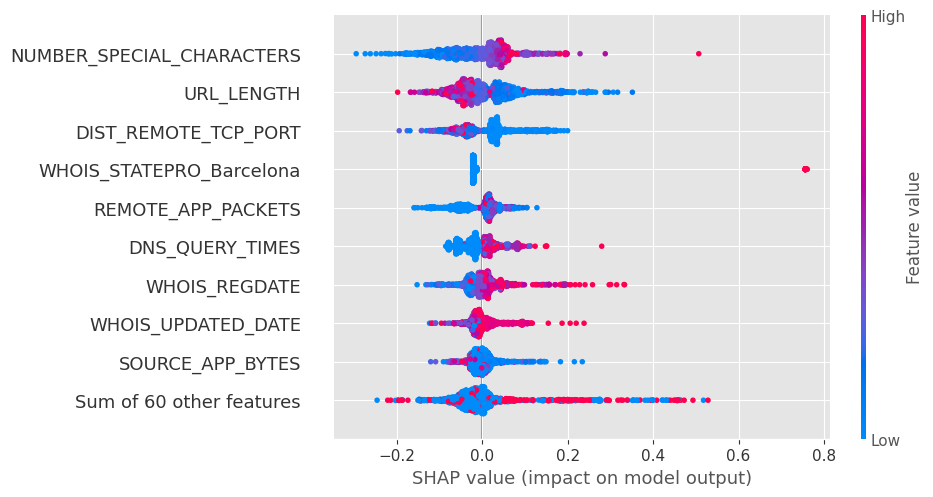

In [73]:
# Generate a SHAP beeswarm plot to visualize the overall feature importance.
# This plot shows how each feature influences the model's predictions across all instances.
shap.plots.beeswarm(shap_values)  
plt.show()  # Display the plot.

### End